In [89]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from separation_en_lignes import separe_en_lignes

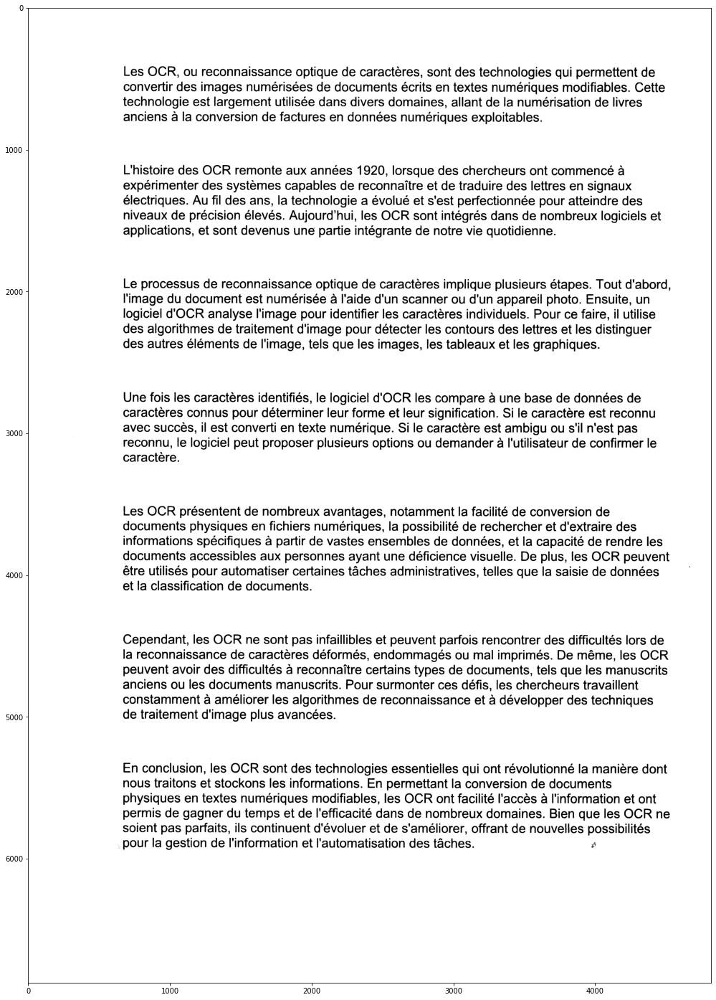

Indices y de début de fin pour chaque ligne : [(412, 486), (521, 593), (626, 697), (734, 745), (747, 803), (1107, 1180), (1217, 1287), (1321, 1392), (1426, 1498), (1535, 1604), (1912, 1982), (2016, 2087), (2119, 2192), (2198, 2201), (2228, 2299), (2308, 2310), (2334, 2404), (2409, 2419), (2711, 2783), (2820, 2889), (2924, 2995), (3031, 3101), (3150, 3200), (3513, 3585), (3619, 3690), (3722, 3794), (3831, 3901), (3935, 4006), (4044, 4049), (4056, 4108), (4417, 4490), (4525, 4596), (4628, 4702), (4737, 4807), (4842, 4913), (4961, 5014), (5324, 5398), (5432, 5503), (5537, 5609), (5643, 5714), (5718, 5720), (5748, 5819), (5853, 5922)]


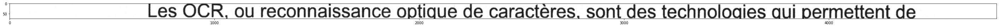

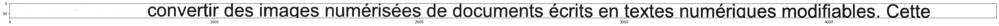

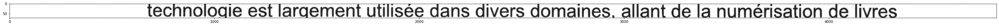

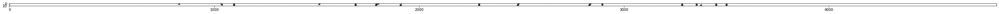

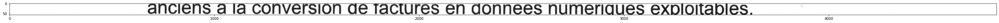

...

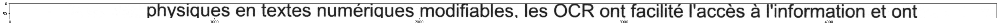

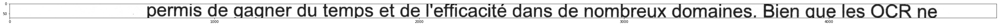

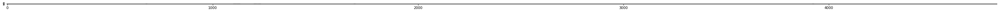

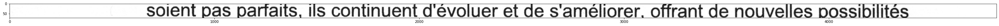

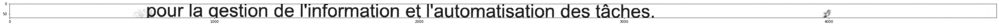

In [90]:
image = cv2.imread('scan1.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
(thresh, image_binary) = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

plt.figure(figsize=(50,25))
plt.imshow(image_binary, cmap=plt.cm.gray)
plt.show()

indices_lignes = separe_en_lignes(image_binary)
print("Indices y de début de fin pour chaque ligne :", indices_lignes)

for t in indices_lignes :   
    plt.figure(figsize=(50,25))
    plt.imshow(image[t[0]:t[1]])
    plt.show()

In [91]:
print(len(indices_lignes))

test = list(indices_lignes)

43


In [92]:
liste_hauteurs = []
for elt in test :
    liste_hauteurs.append((elt[1]-elt[0]))
print(liste_hauteurs)

[74, 72, 71, 11, 56, 73, 70, 71, 72, 69, 70, 71, 73, 3, 71, 2, 70, 10, 72, 69, 71, 70, 50, 72, 71, 72, 70, 71, 5, 52, 73, 71, 74, 70, 71, 53, 74, 71, 72, 71, 2, 71, 69]


In [93]:
liste_indices_a_supprimer = []
for i in range(1, len(test)) :
    if liste_hauteurs[i] < liste_hauteurs[i-1]*0.6 :
        liste_indices_a_supprimer.append(i)
        out = test[i]
        test[i-1] = (test[i-1][0], out[1])
print(liste_indices_a_supprimer)     
print(test)
print(len(test))


[3, 13, 15, 17, 28, 40]
[(412, 486), (521, 593), (626, 745), (734, 745), (747, 803), (1107, 1180), (1217, 1287), (1321, 1392), (1426, 1498), (1535, 1604), (1912, 1982), (2016, 2087), (2119, 2201), (2198, 2201), (2228, 2310), (2308, 2310), (2334, 2419), (2409, 2419), (2711, 2783), (2820, 2889), (2924, 2995), (3031, 3101), (3150, 3200), (3513, 3585), (3619, 3690), (3722, 3794), (3831, 3901), (3935, 4049), (4044, 4049), (4056, 4108), (4417, 4490), (4525, 4596), (4628, 4702), (4737, 4807), (4842, 4913), (4961, 5014), (5324, 5398), (5432, 5503), (5537, 5609), (5643, 5720), (5718, 5720), (5748, 5819), (5853, 5922)]
43


In [94]:
liste_finale = []
for i in range(len(test)) :
    if i not in liste_indices_a_supprimer :
        liste_finale.append(indices_lignes[i])

print(liste_finale)
print(len(liste_finale))

[(412, 486), (521, 593), (626, 697), (747, 803), (1107, 1180), (1217, 1287), (1321, 1392), (1426, 1498), (1535, 1604), (1912, 1982), (2016, 2087), (2119, 2192), (2228, 2299), (2334, 2404), (2711, 2783), (2820, 2889), (2924, 2995), (3031, 3101), (3150, 3200), (3513, 3585), (3619, 3690), (3722, 3794), (3831, 3901), (3935, 4006), (4056, 4108), (4417, 4490), (4525, 4596), (4628, 4702), (4737, 4807), (4842, 4913), (4961, 5014), (5324, 5398), (5432, 5503), (5537, 5609), (5643, 5714), (5748, 5819), (5853, 5922)]
37


In [96]:
print(liste_hauteurs)

[74, 72, 71, 11, 56, 73, 70, 71, 72, 69, 70, 71, 73, 3, 71, 2, 70, 10, 72, 69, 71, 70, 50, 72, 71, 72, 70, 71, 5, 52, 73, 71, 74, 70, 71, 53, 74, 71, 72, 71, 2, 71, 69]


37


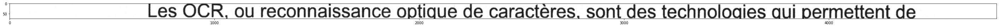

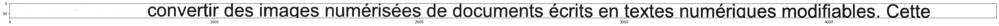

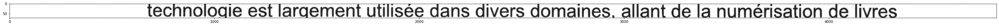

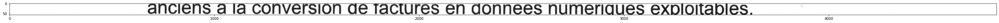

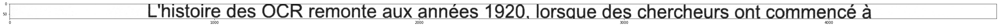

...

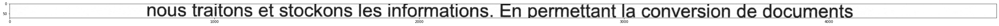

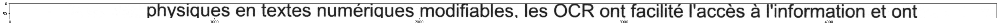

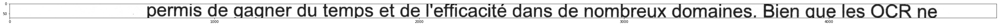

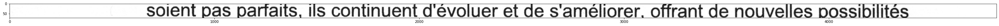

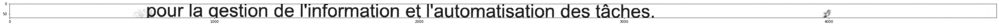

In [95]:
print(len(liste_finale))
for t in liste_finale :   
    plt.figure(figsize=(50,25))
    plt.imshow(image[t[0]:t[1]])
    plt.show()